In [1]:
%run '../dynamo_helper_functions.ipynb'

/tmp/ipykernel_2461881/3777615979.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


['/net/capricorn/home/xing/soh29/.conda/envs/dynamo_06_2024/lib/python3.8/site-packages/dynamo']


package,umap-learn,trimap,tqdm,statsmodels,setuptools,seaborn,scipy,scikit-learn,python-igraph,pynndescent,pre-commit,pandas,numpy,numdifftools,numba,networkx,matplotlib,loompy,hdbscan,dynamo-release,cvxopt,colorcet
version,0.5.6,1.1.4,4.66.4,0.14.1,70.1.0,0.13.2,1.10.1,1.3.2,0.11.5,0.5.8,3.5.0,1.2.0,1.23.0,0.9.41,0.51.2,3.1,3.7.5,3.0.7,0.8.37,1.0.0,1.3.2,3.1.0


In [2]:
data_names = [0,12.5,25,50,100,200,400,800]
#fig_path = "fig1_plots/"
colors = {'G1.S':'firebrick', 'S':'orange', 'G2':'yellowgreen', 'G2.M':'teal', 'M.G1':'royalblue'}
colors2 = {'G1-S':'firebrick', 'S':'orange', 'G2-M':'yellowgreen', 'M':'teal', 'M-G1':'royalblue'} #Dynamo

# Load data

In [6]:
adata = dyn.read_loom("../../data/static_MCF10A/processed_possorted_genome_bam_RIG79.loom")
temp = np.empty((len(adata.obs),1), dtype=object)
temp.shape
for i in range(len(adata.obs)):
    temp[i] = str(int(float(adata.obs['dosage'][i])))
adata.obs['dosage'] = temp

In [10]:
# MCF10A data with density
same_ref_with_density = reload_data2("../../data/static_MCF10A/generated_data/With_density/Same_Ref_With_Density_vf_", 
                                    '../../data/static_MCF10A/generated_data/With_density/uns_dict_')

In [12]:
# MCF10A data without density
same_ref_without_density = reload_data2("../../data/static_MCF10A/generated_data/Without_density/Same_Ref_Without_Density_vf_", 
                                       '../../data/static_MCF10A/generated_data/Without_density/uns_dict_')

In [13]:
# MCF10A data processed separately 
# UMAPs are unrelated
ind_ref_without_density = reload_data2("../../data/static_MCF10A/generated_data/Ind_Without_density/Ind_Ref_Without_Density_vf_", 
                                      '../../data/static_MCF10A/generated_data/Ind_Without_density/uns_dict_')

# Gene expression on UMAP space
- static MCF10a

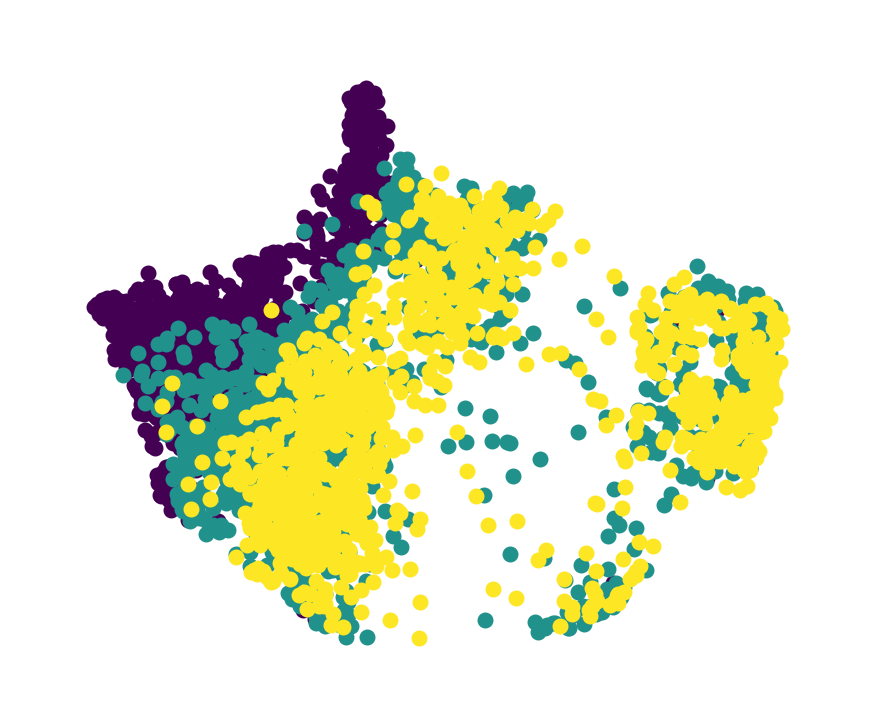

In [14]:
# untreated, 12.5, 25 pM TGFb treated cells UMAP space
colormap = plt.cm.get_cmap("viridis")
plt.figure(figsize=(1.5,1.25), dpi=300)
plt.subplot(1,1,1,frame_on=False)
for i in range(3):
    plt.scatter(same_ref_with_density[i].obsm['X_umap'][:,0],
                same_ref_with_density[i].obsm['X_umap'][:,1],
                color=colormap(i/2),
                s=2)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
#plt.savefig(fig_path + "panelB_MCF10A_emt_progression_3_doses.png", dpi=600, transparent=True)

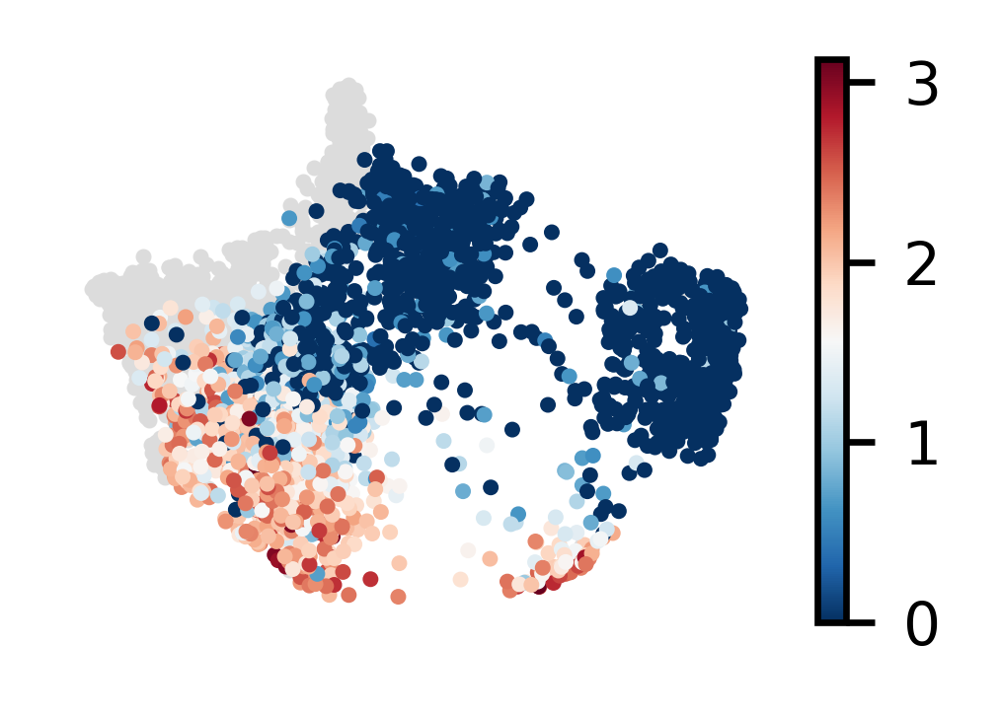

In [15]:
# MCF10A cell cycle expression
# Gene: Top2a
colormap = plt.cm.get_cmap("viridis")
gene = 'TOP2A'
plt.figure(figsize=(1.75,1.25), dpi=300)
plt.subplot(1,1,1,frame_on=False)
plt.scatter(same_ref_with_density[0].obsm['X_umap'][:,0],
                same_ref_with_density[0].obsm['X_umap'][:,1],
                color='gainsboro',
                s=2)
for i in range(1,3):
    same_ref_with_density[i].var.index = same_ref_with_density[i].var['var_names']
    exp = same_ref_with_density[i].X.toarray()
    gene_index = same_ref_with_density[i].var.index.get_loc(gene)
    plt.scatter(same_ref_with_density[i].obsm['X_umap'][:,0],
                same_ref_with_density[i].obsm['X_umap'][:,1],
                c=exp[:,gene_index],
                s=2)
plt.xticks([])
plt.yticks([])
plt.colorbar()
plt.tight_layout()
#plt.savefig(fig_path + "Supp_MCF10A_top2a_tgfb_3_doses.png", dpi=600, transparent=True)

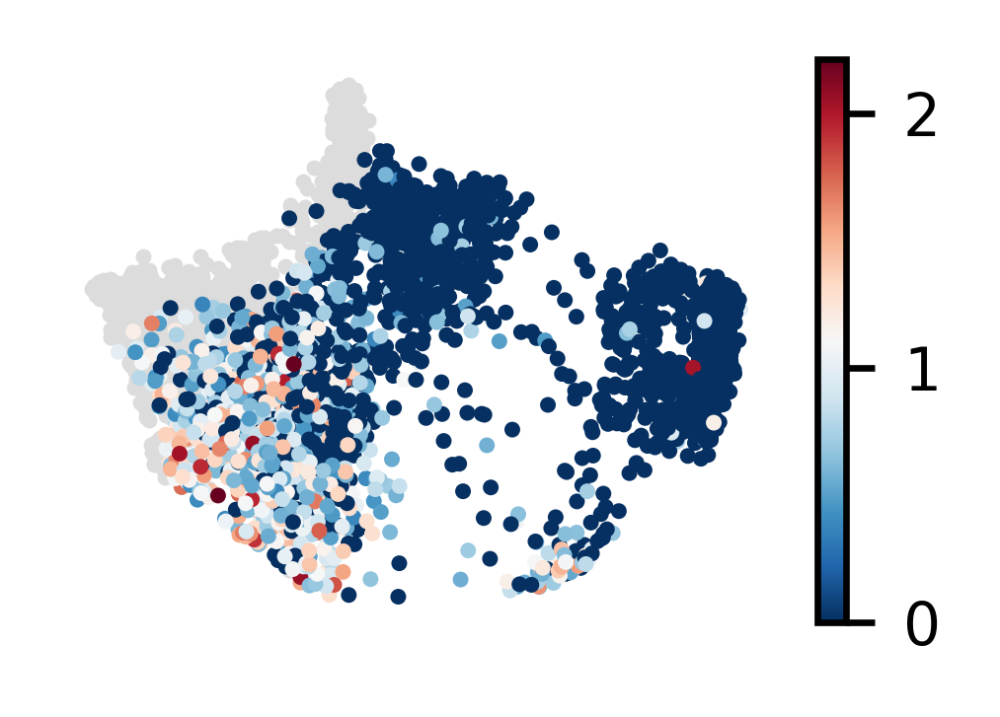

In [16]:
# MCF10A cell cycle expression
# Gene: CCNB1
colormap = plt.cm.get_cmap("viridis")
gene = 'CCNB1'
plt.figure(figsize=(1.75,1.25), dpi=300)
plt.subplot(1,1,1,frame_on=False)
plt.scatter(same_ref_with_density[0].obsm['X_umap'][:,0],
                same_ref_with_density[0].obsm['X_umap'][:,1],
                color='gainsboro',
                s=2)
for i in range(1,3):
    same_ref_with_density[i].var.index = same_ref_with_density[i].var['var_names']
    exp = same_ref_with_density[i].X.toarray()
    gene_index = same_ref_with_density[i].var.index.get_loc(gene)
    plt.scatter(same_ref_with_density[i].obsm['X_umap'][:,0],
                same_ref_with_density[i].obsm['X_umap'][:,1],
                c=exp[:,gene_index],
                s=2)
plt.xticks([])
plt.yticks([])
plt.colorbar()
plt.tight_layout()
#plt.savefig(fig_path + "Supp_MCF10A_ccnb1_tgfb_3_doses.png", dpi=600, transparent=True)

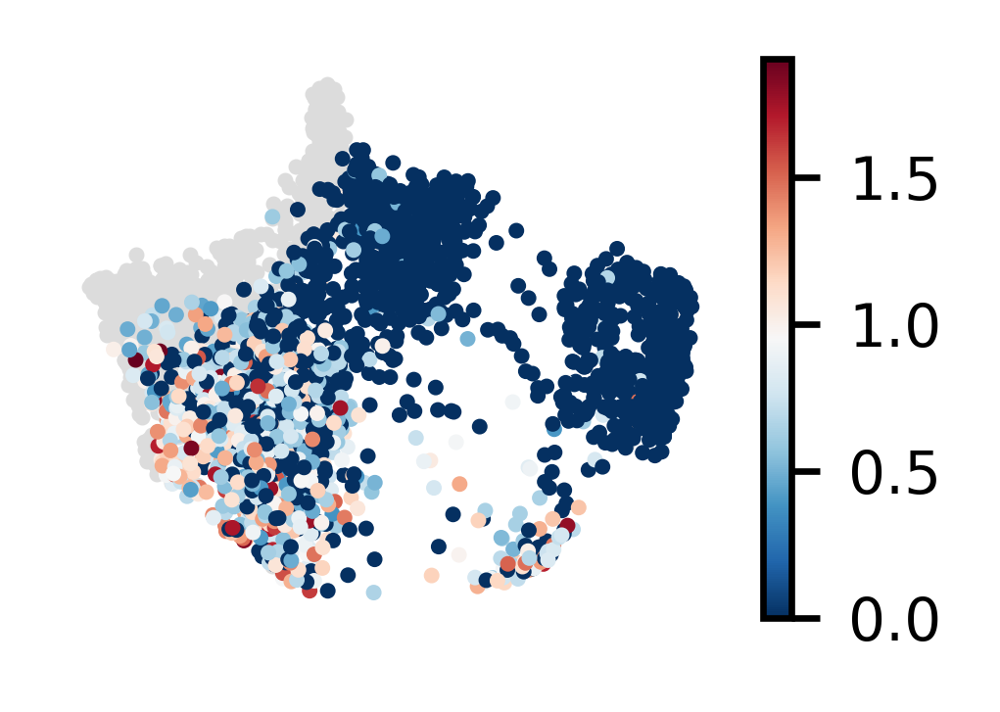

In [17]:
# MCF10A cell cycle expression
# Gene: CCNA2
colormap = plt.cm.get_cmap("viridis")
gene = 'CCNA2'
plt.figure(figsize=(1.75,1.25), dpi=300)
plt.subplot(1,1,1,frame_on=False)
plt.scatter(same_ref_with_density[0].obsm['X_umap'][:,0],
                same_ref_with_density[0].obsm['X_umap'][:,1],
                color='gainsboro',
                s=2)
for i in range(1,3):
    same_ref_with_density[i].var.index = same_ref_with_density[i].var['var_names']
    exp = same_ref_with_density[i].X.toarray()
    gene_index = same_ref_with_density[i].var.index.get_loc(gene)
    plt.scatter(same_ref_with_density[i].obsm['X_umap'][:,0],
                same_ref_with_density[i].obsm['X_umap'][:,1],
                c=exp[:,gene_index],
                s=2)
plt.xticks([])
plt.yticks([])
plt.colorbar()
plt.tight_layout()
#plt.savefig(fig_path + "Supp_MCF10A_ccna2_tgfb_3_doses.png", dpi=600, transparent=True)

# Cell cycle estimation

## Dose 12.5

In [25]:
dose12 = adata[adata.obs['dosage']=='12']

In [27]:
dyn.pp.recipe_monocle(dose12, keep_filtered_genes=True)

|-----> recipe_monocle_keep_filtered_cells_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_cells_key=True
|-----> recipe_monocle_keep_raw_layers_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_raw_layers_key=True
|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['pp'] in AnnData Object.
|-----------> <insert> experiment_type to uns['pp'] in AnnData Object.
|-----> filtering cells...
|-----> <insert> pass_

In [28]:
dyn.pp.cell_cycle_scores(dose12)

|-----> computing cell phase...
|-----> [cell phase estimation] in progress: 100.0000%
|-----> [cell phase estimation] finished [252.1629s]
|-----> <insert> cell_cycle_phase to obs in AnnData Object.
|-----> <insert> cell_cycle_scores to obsm in AnnData Object.
|-----> [Cell Cycle Scores Estimation] in progress: 100.0000%
|-----> [Cell Cycle Scores Estimation] finished [0.3358s]


In [40]:
same_ref_with_density[1].obs.index = same_ref_with_density[1].obs['obs_names']

In [41]:
same_ref_with_density[1].obs['cell_cycle_phase'] = dose12.obs['cell_cycle_phase'].reindex(same_ref_with_density[1].obs.index)

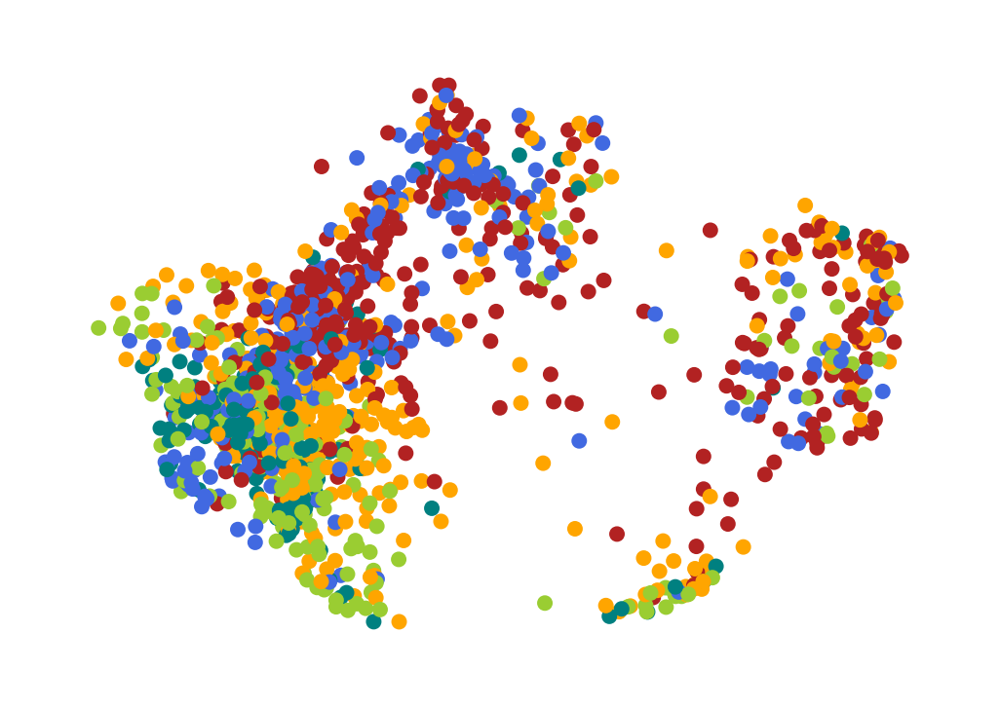

In [44]:
# EMT progression: MCF10A dataset
#colormap = plt.cm.get_cmap("Purples_r")
colormap = plt.cm.get_cmap("viridis")
plt.figure(figsize=(1.75,1.25), dpi=300)
plt.subplot(1,1,1,frame_on=False)
#for i in range(1):
plt.scatter(same_ref_with_density[1].obsm['X_umap'][:,0],
            same_ref_with_density[1].obsm['X_umap'][:,1],
            c=same_ref_with_density[1].obs['cell_cycle_phase'].map(colors2),
            #color=colormap(1/3),
            s=2,
           )
plt.xticks([])
plt.yticks([])
plt.tight_layout()
plt.savefig("fig2_plots/dose12_cell_cycle_phase.png", dpi=600, transparent=True)

## Dose 25

In [46]:
dose25 = adata[adata.obs['dosage']=='25']
dyn.pp.recipe_monocle(dose25, keep_filtered_genes=True)
dyn.pp.cell_cycle_scores(dose25)

|-----> recipe_monocle_keep_filtered_cells_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_cells_key=True
|-----> recipe_monocle_keep_raw_layers_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_raw_layers_key=True
|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['pp'] in AnnData Object.
|-----------> <insert> experiment_type to uns['pp'] in AnnData Object.
|-----> filtering cells...
|-----> <insert> pass_

In [53]:
same_ref_with_density[2].obs.index = same_ref_with_density[2].obs['obs_names']
same_ref_with_density[2].obs['cell_cycle_phase'] = dose25.obs['cell_cycle_phase'].reindex(same_ref_with_density[2].obs.index)

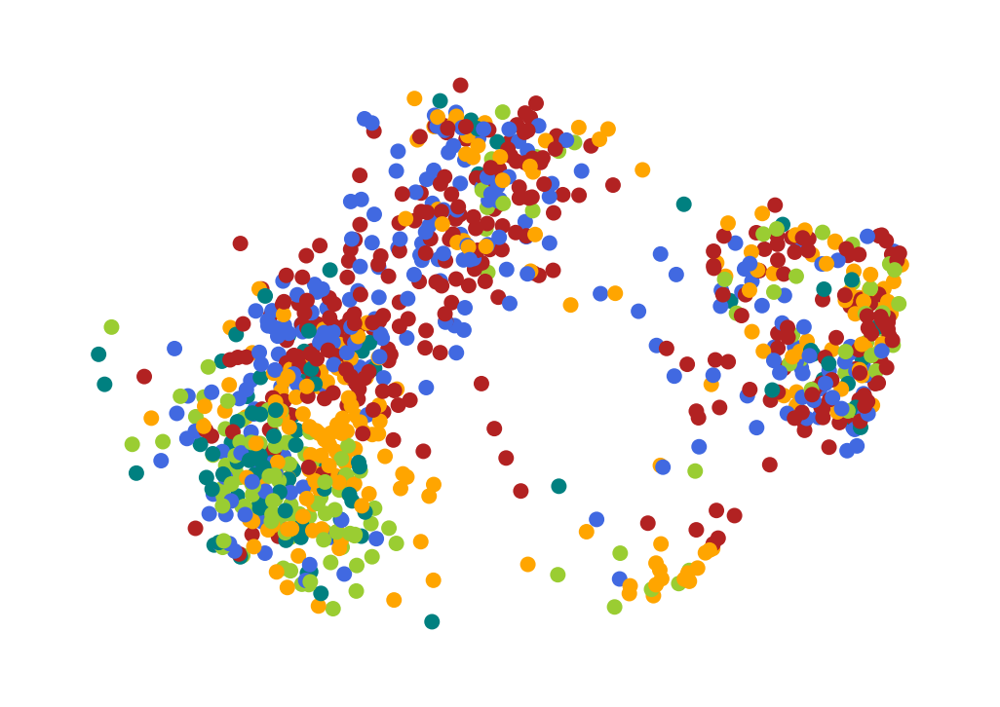

In [60]:
# EMT progression: MCF10A dataset
#colormap = plt.cm.get_cmap("Purples_r")
colormap = plt.cm.get_cmap("viridis")
plt.figure(figsize=(1.75,1.25), dpi=300)
plt.subplot(1,1,1,frame_on=False)
#for i in range(1):
plt.scatter(same_ref_with_density[2].obsm['X_umap'][:,0],
            same_ref_with_density[2].obsm['X_umap'][:,1],
            c=same_ref_with_density[2].obs['cell_cycle_phase'].map(colors2),
            s=2,
           )
plt.xticks([])
plt.yticks([])
plt.tight_layout()
plt.savefig("fig2_plots/dose25_cell_cycle_phase.png", dpi=600, transparent=True)

# Untreated MCF10A cells
* comparing mRNA counts between two stable points
* comparing cell cycle phase estimation between the two stable point regions

## Fixed points

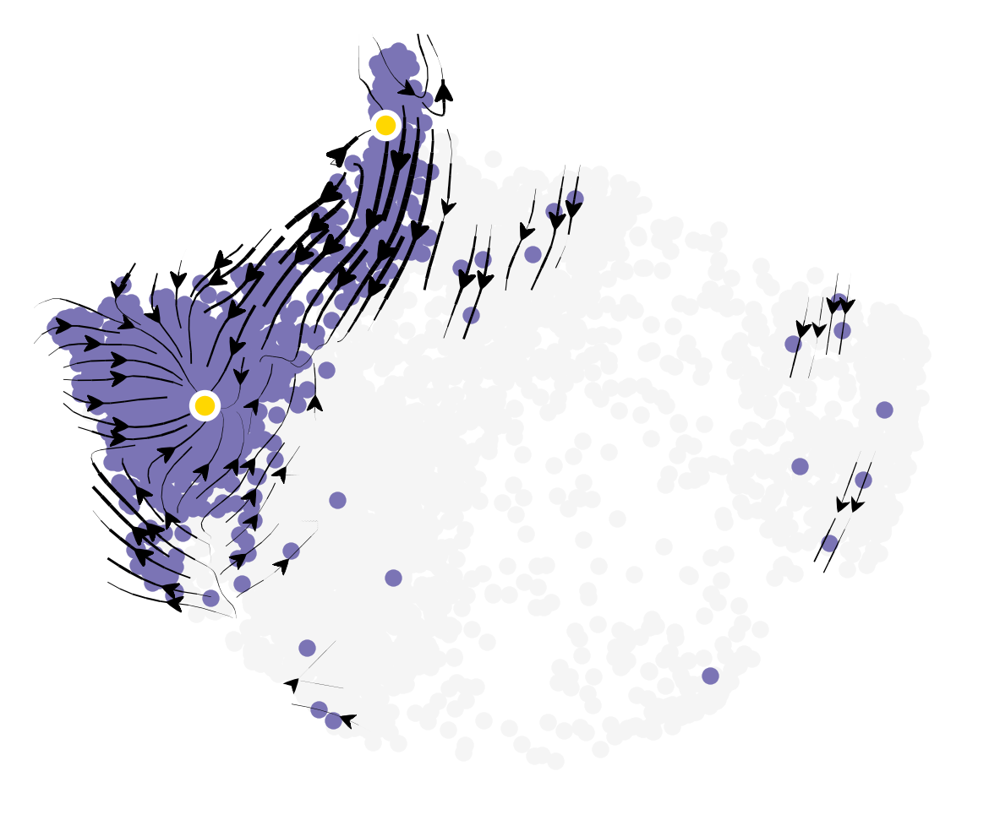

In [17]:
# MCF10A static: dose 0
colormap = plt.cm.get_cmap("Purples_r")
plt.figure(figsize=(3,2.5), dpi=200)
plt.subplot(1,1,1,frame_on=False)
#Plotting background cells
for i in range(4):
    plt.scatter(same_ref_with_density[i].obsm['X_umap'][:,0],
                same_ref_with_density[i].obsm['X_umap'][:,1],
                color='whitesmoke',s=10) 
#Plotting dose 0 cells
plt.scatter(same_ref_with_density[0].obsm['X_umap'][:,0],
            same_ref_with_density[0].obsm['X_umap'][:,1],
            color=colormap(0.35), s=10, zorder=1,label='0 pM')
#Plotting dose 0 vector field
dyn.pl.zstreamline(same_ref_with_density[0], basis='umap', #density=0.8, 
                   arrowsize=0.8, linewidth=0.8, zorder=2)
_, stable, _,_ = getFixedPoints(same_ref_without_density[0], basis='umap')
# Plotting stable fixed point
plt.scatter(stable[:,0],
            stable[:,1],
            s=30, linewidth=1.25,
            color='gold',edgecolors='white',zorder=3)
#Plotting mapped stable fixed point
_, ind_stable, _, _ = getFixedPoints(ind_ref_without_density[0], basis='umap')
new_coords = []
dose0_coord = []
for i in range(len(ind_stable)):
    index = getNNeighbors([ind_stable[i][0], ind_stable[i][1]], ind_ref_without_density[0].obsm['X_umap'], 1)[0][0]
    fp_coords = ind_stable[i]
    ind_coords = ind_ref_without_density[0].obsm['X_umap'][index]
    dist = np.sqrt((fp_coords[0] - ind_coords[0])**2 + (fp_coords[1] - ind_coords[1])**2)
    if dist < 1:
        new_coords.append(ind_coords.tolist())
        dose0_coord.append(same_ref_without_density[0].obsm['X_umap'][index])
        plt.scatter(same_ref_without_density[0].obsm['X_umap'][index][0], 
                    same_ref_without_density[0].obsm['X_umap'][index][1], 
                    color = 'gold', s=30, edgecolors= "white", linewidths=1.25, 
                    zorder=3)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
#plt.savefig(fig_path + "panelC_MCF10A_dose_0_vf.png", dpi=300, transparent=True)

## RNA count

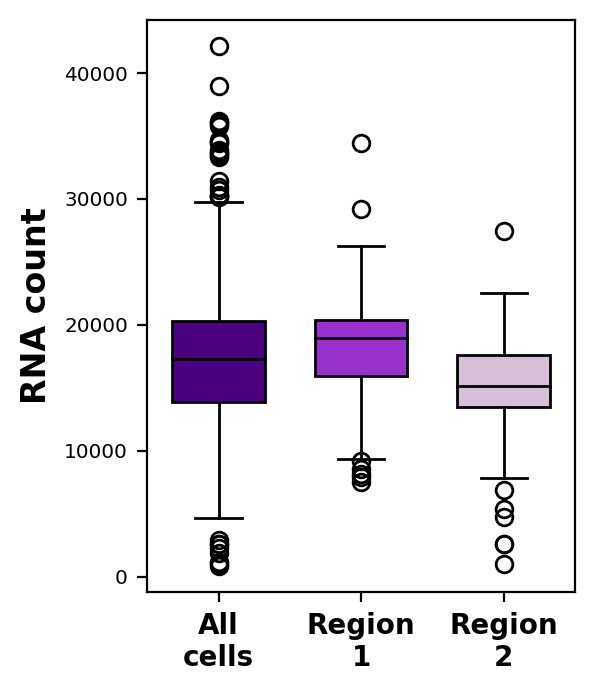

In [207]:
# MCF10A static: RNA count
attractor1_indexes = getNNeighbors([-3.7655506, 0.94708794], 
                                    same_ref_with_density[0].obsm['X_umap'], 
                                    k=175)
attractor2_indexes = getNNeighbors(stable[:,0:2], 
                                   same_ref_with_density[0].obsm['X_umap'], 
                                   k=175)
adata1 = same_ref_with_density[0][attractor1_indexes[0],:]
adata2 = same_ref_with_density[0][attractor2_indexes[0],:]
fig, ax = plt.subplots(figsize=(3,3.5))
parts = ax.boxplot([same_ref_with_density[0].obs['nCounts'], adata1.obs['nCounts'], adata2.obs['nCounts']],
                    widths=0.65,
                    patch_artist=True)
colors = ['indigo','darkorchid', 'thistle']
for patch, color in zip(parts['boxes'], colors):
    patch.set_facecolor(color)
    
for median in parts['medians']:
    median.set_color('black')

plt.xticks([1,2,3], ['All\ncells','Region\n1', 'Region\n2'], fontsize=10, fontweight="bold")
plt.ylabel("RNA count", fontsize=12, fontweight="bold")
plt.tight_layout()
#plt.savefig(fig_path + "Supp_MCF10A_dose_0_rna_count.png", transparent=True, dpi=300)

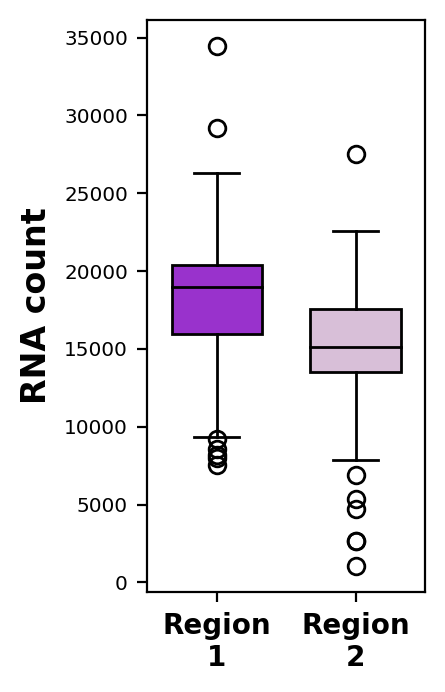

In [208]:
fig, ax = plt.subplots(figsize=(2.25,3.5))
parts = ax.boxplot([adata1.obs['nCounts'], adata2.obs['nCounts']],
                    widths=0.65,
                    patch_artist=True)
colors = ['darkorchid', 'thistle']
for patch, color in zip(parts['boxes'], colors):
    patch.set_facecolor(color)
    
for median in parts['medians']:
    median.set_color('black')

plt.xticks([1,2], ['Region\n1', 'Region\n2'], fontsize=10, fontweight="bold")
plt.ylabel("RNA count", fontsize=12, fontweight="bold")
plt.tight_layout()
#plt.savefig(fig_path + "Supp_MCF10A_dose_0_rna_count2.png", transparent=True, dpi=300)

## Cell cycle phase count

In [13]:
dose0_adata = processAdata_sameRef(adata, same_ref_without_density[0], '0', None, density=True)
dyn.pp.cell_cycle_scores(dose0_adata)

|-----> recipe_monocle_keep_filtered_cells_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_cells_key=True
|-----> recipe_monocle_keep_raw_layers_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_raw_layers_key=True
|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['pp'] in AnnData Object.
|-----------> <insert> experiment_type to uns['pp'] in AnnData Object.
|-----> filtering cells...
|-----> <insert> pass_

Text(0.5, 0, 'Cell cycle phase')

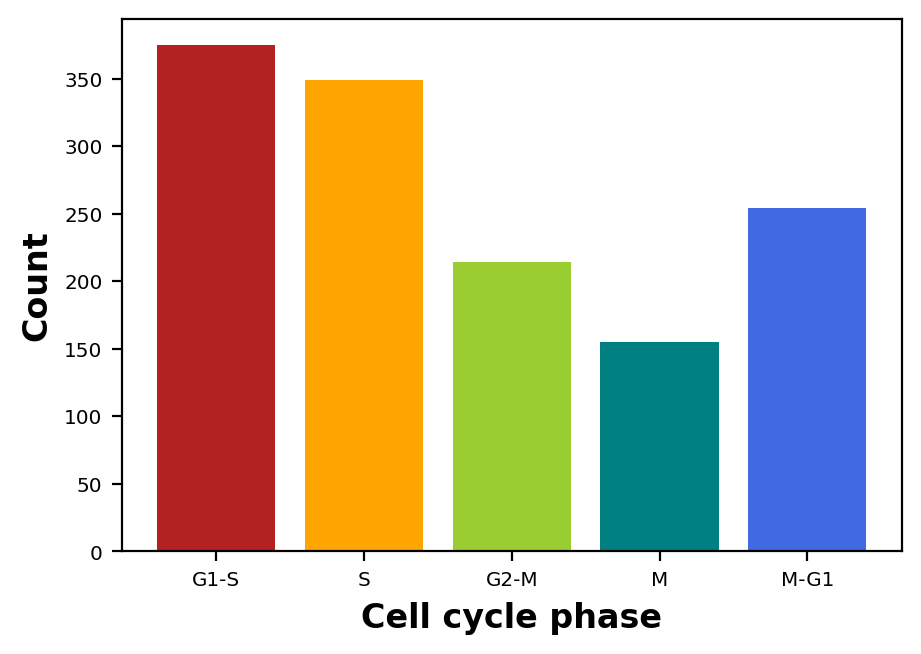

In [14]:
colors2 = {'G1-S':'firebrick', 'S':'orange', 'G2-M':'yellowgreen', 'M':'teal', 'M-G1':'royalblue'} #Dynamo
all_cells_cc_score = pd.DataFrame(dose0_adata.obs['cell_cycle_phase'].value_counts()).reindex(['G1-S','S','G2-M','M','M-G1'])
plt.figure(figsize=(5,3.5))
#plt.subplot(1,2,1)
plt.bar(colors2.keys(), all_cells_cc_score['cell_cycle_phase'], color=list(colors2.values()))
plt.ylabel("Count", fontsize=12, fontweight="bold")
plt.xlabel("Cell cycle phase", fontsize=12, fontweight="bold")
#plt.savefig("Plots/Fig1/supplemental/quiescent/all_cells_comp_cell_phase_bar.png", transparent=True, dpi=300)

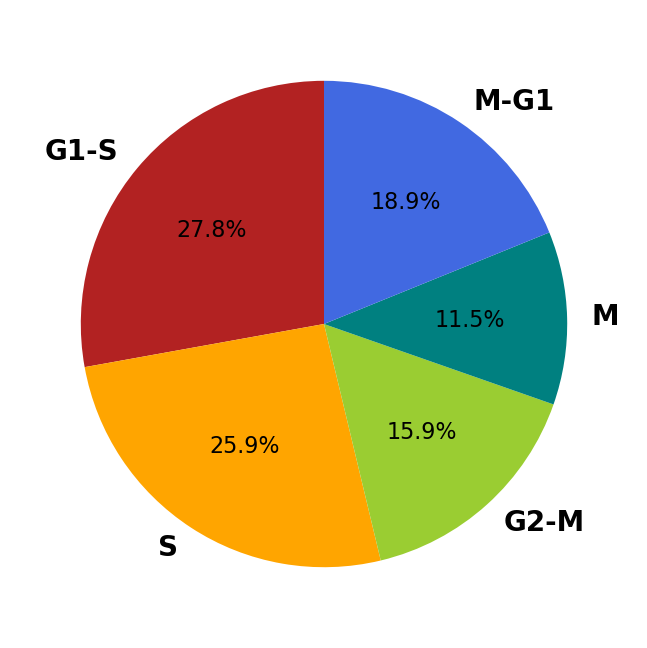

In [15]:
patches, texts, autotexts = plt.pie(all_cells_cc_score['cell_cycle_phase'],
                            labels=all_cells_cc_score.index,
                            colors=colors2.values(),
                            autopct='%1.1f%%',
                            startangle=90)
for i in range(len(texts)):
    texts[i].set_fontsize(10)
    texts[i].set_fontweight('bold')
#plt.savefig("Plots/Fig1/supplemental/quiescent/all_cells_pie_chart.png", transparent=True, dpi=300)

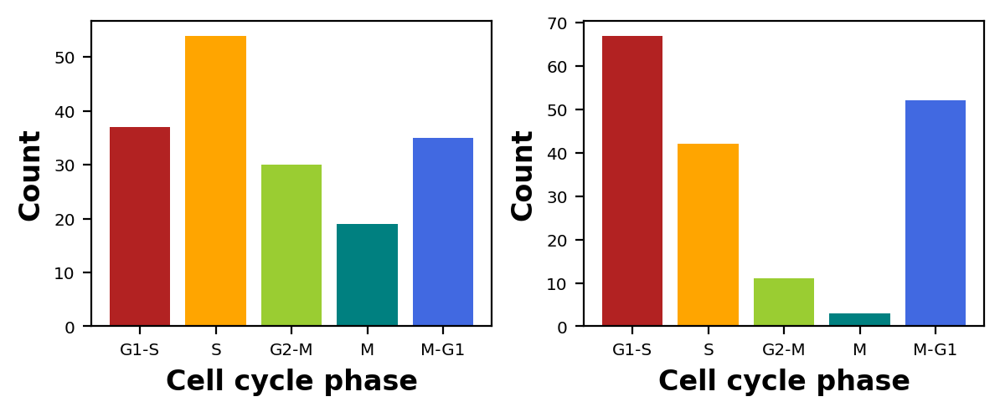

In [18]:
# MCF10A static: RNA count
attractor1_indexes = getNNeighbors([-3.7655506, 0.94708794], 
                                    same_ref_with_density[0].obsm['X_umap'], 
                                    k=175)
attractor2_indexes = getNNeighbors(stable[:,0:2], 
                                   same_ref_with_density[0].obsm['X_umap'], 
                                   k=175)
adata1 = dose0_adata[attractor1_indexes[0],:]
adata2 = dose0_adata[attractor2_indexes[0],:]

colors2 = {'G1-S':'firebrick', 'S':'orange', 'G2-M':'yellowgreen', 'M':'teal', 'M-G1':'royalblue'} #Dynamo
adata1_cc_score = pd.DataFrame(adata1.obs['cell_cycle_phase'].value_counts()).reindex(['G1-S','S','G2-M','M','M-G1'])
adata2_cc_score = pd.DataFrame(adata2.obs['cell_cycle_phase'].value_counts()).reindex(['G1-S','S','G2-M','M','M-G1'])
plt.figure(figsize=(6,2.5))
plt.subplot(1,2,1)
plt.bar(colors2.keys(), adata1_cc_score['cell_cycle_phase'], color=list(colors2.values()))
plt.ylabel("Count", fontsize=12, fontweight="bold")
plt.xlabel("Cell cycle phase", fontsize=12, fontweight="bold")

plt.subplot(1,2,2)
plt.bar(colors2.keys(), adata2_cc_score['cell_cycle_phase'], color=list(colors2.values()))
plt.ylabel("Count", fontsize=12, fontweight="bold")
plt.xlabel("Cell cycle phase", fontsize=12, fontweight="bold")
plt.tight_layout()

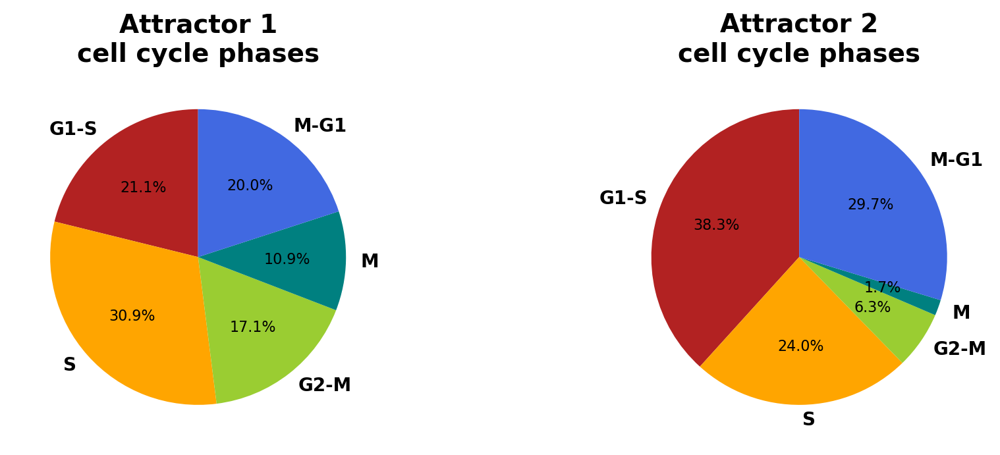

In [19]:
plt.figure(figsize=(10, 3.5))
plt.subplot(1,2,1)
patches, texts, autotexts = plt.pie(adata1_cc_score['cell_cycle_phase'],
                                    labels=all_cells_cc_score.index,
                                    colors=colors2.values(),
                                    autopct='%1.1f%%',
                                    startangle=90)
plt.title("Attractor 1\ncell cycle phases", fontsize=14, fontweight='bold')
for i in range(len(texts)):
    texts[i].set_fontsize(10)
    texts[i].set_fontweight('bold')
    
plt.subplot(1,2,2)
patches, texts, autotexts = plt.pie(adata2_cc_score['cell_cycle_phase'],
                                    labels=all_cells_cc_score.index,
                                    colors=colors2.values(),
                                    autopct='%1.1f%%',
                                    startangle=90)
plt.title("Attractor 2\ncell cycle phases", fontsize=14, fontweight='bold')
for i in range(len(texts)):
    texts[i].set_fontsize(10)
    texts[i].set_fontweight('bold')
plt.tight_layout()
#plt.savefig(fig_path + "Supp_MCF10A_dose_0_ccPhase_pie_charts.png", transparent=True, dpi=300)

In [ ]:
# plt.figure(figsize=(10, 3.5))
plt.subplot(1,2,1)
patches, texts, autotexts = plt.pie(adata1_cc_score['cell_cycle_phase'],
                                    #labels=all_cells_cc_score.index,
                                    colors=colors2.values(),
                                    autopct='%1.1f%%',
                                    startangle=90)
plt.title("Attractor 1\ncell cycle phases", fontsize=14, fontweight='bold')
# for i in range(len(texts)):
#     texts[i].set_fontsize(10)
#     texts[i].set_fontweight('bold')
    
plt.subplot(1,2,2)
patches, texts, autotexts = plt.pie(adata2_cc_score['cell_cycle_phase'],
                                    #labels=all_cells_cc_score.index,
                                    colors=colors2.values(),
                                    autopct='%1.1f%%',
                                    startangle=90)
plt.title("Attractor 2\ncell cycle phases", fontsize=14, fontweight='bold')
# for i in range(len(texts)):
#     texts[i].set_fontsize(10)
#     texts[i].set_fontweight('bold')
plt.tight_layout()
plt.savefig(fig_path + "Supp_MCF10A_dose_0_ccPhase_pie_charts.png", transparent=True, dpi=300)

## Gene expression

In [17]:
xls = pd.ExcelFile('../../data/gene_lists/universally_down_up_reg_g0.xlsx')
df1 = pd.read_excel(xls, 'Down in Quiescence')
df2 = pd.read_excel(xls, 'Up in Quiescence')

In [18]:
down_reg = df1['Gene Symbol']
up_reg = df2['Gene Symbol']

In [53]:
same_ref_with_density[0].var.index = same_ref_with_density[0].var['var_names']

In [54]:
valid_down_reg = []
for i in range(len(down_reg)):
    if down_reg[i] in same_ref_with_density[0].var.index:
        valid_down_reg.append(down_reg[i])

In [55]:
valid_down_reg

['NCAPD2',
 'NUCKS1',
 'SMC1A',
 'HSP90AA1',
 'KHSRP',
 'HSP90AB1',
 'NPRL3',
 'PTGES3',
 'SRSF3',
 'SMC4',
 'USP22',
 'DEK',
 'DUT',
 'PCNA',
 'NASP',
 'CCNB1',
 'ANP32B',
 'HMGA1',
 'PRCC',
 'RRP1B',
 'SLBP',
 'PSIP1',
 'DIS3L',
 'PTMA',
 'HMGB1',
 'TEAD4']

In [56]:
valid_up_reg = []
for i in range(len(up_reg)):
    if up_reg[i] in same_ref_with_density[0].var.index:
        valid_down_reg.append(up_reg[i])

In [57]:
valid_up_reg

[]

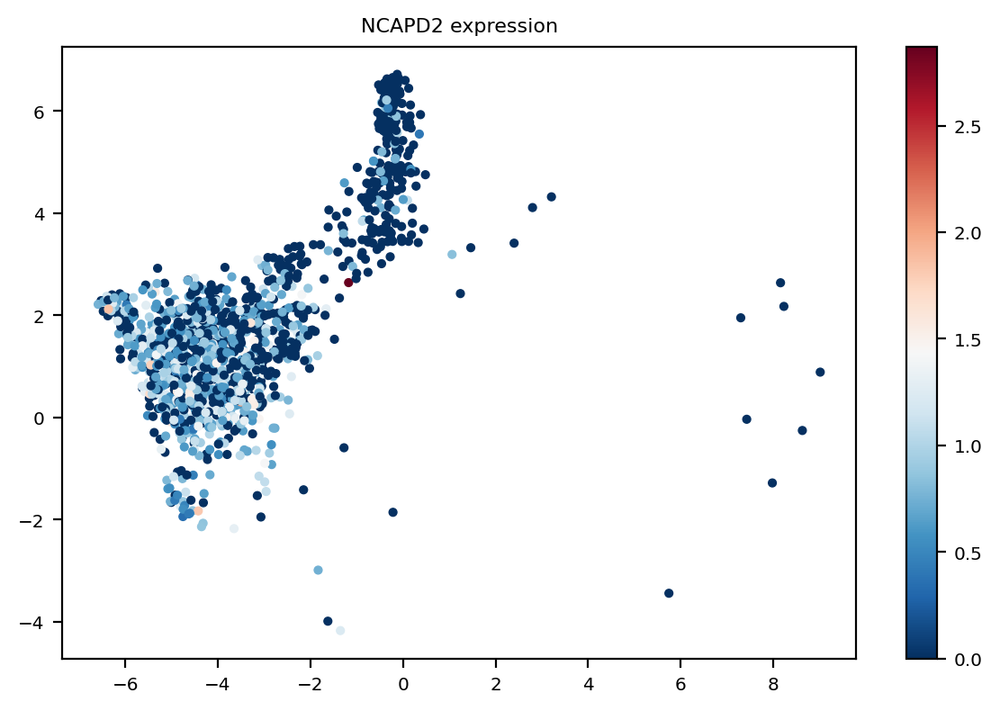

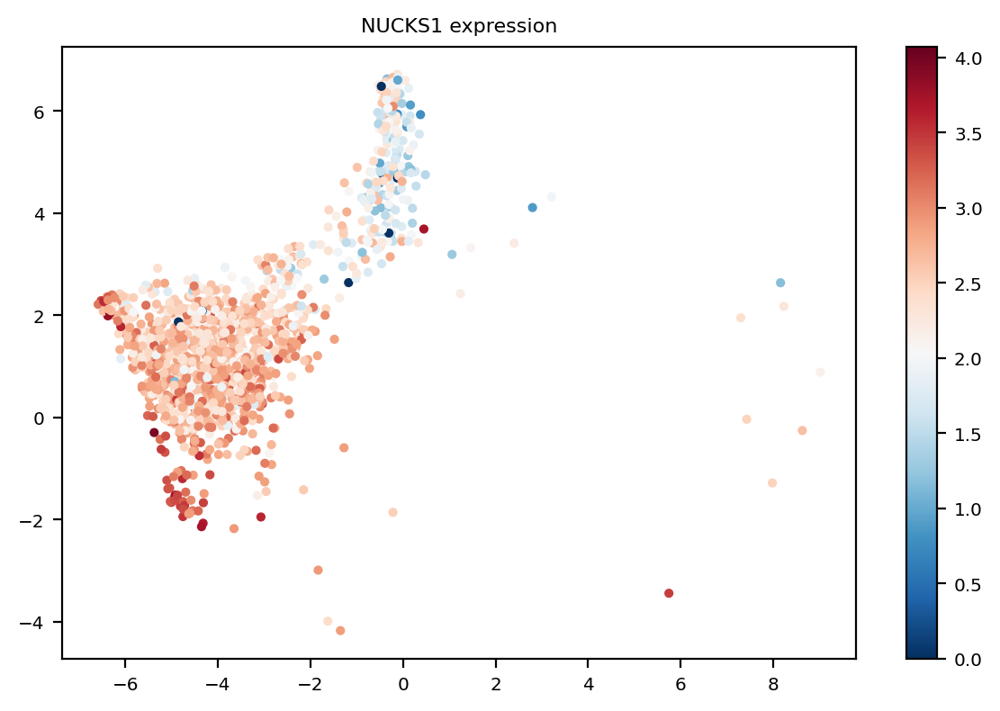

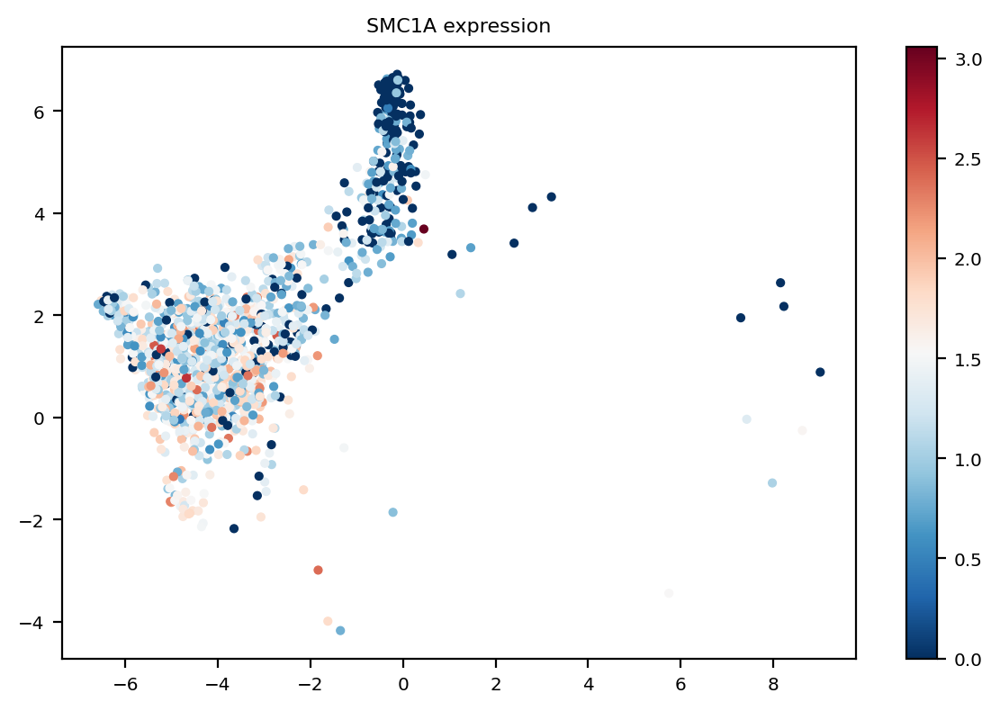

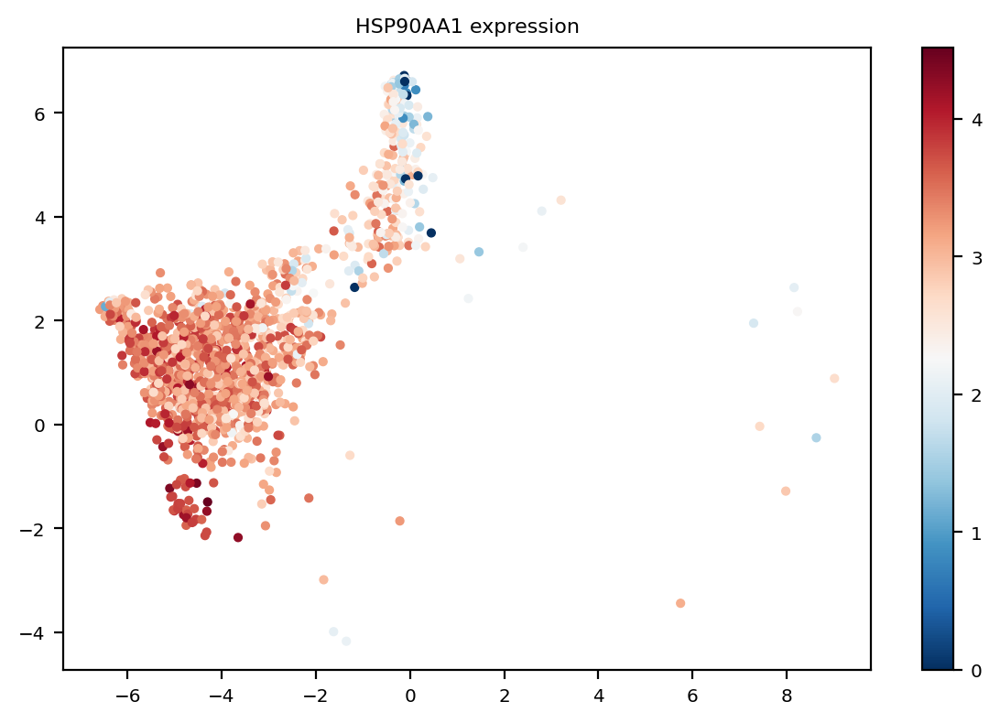

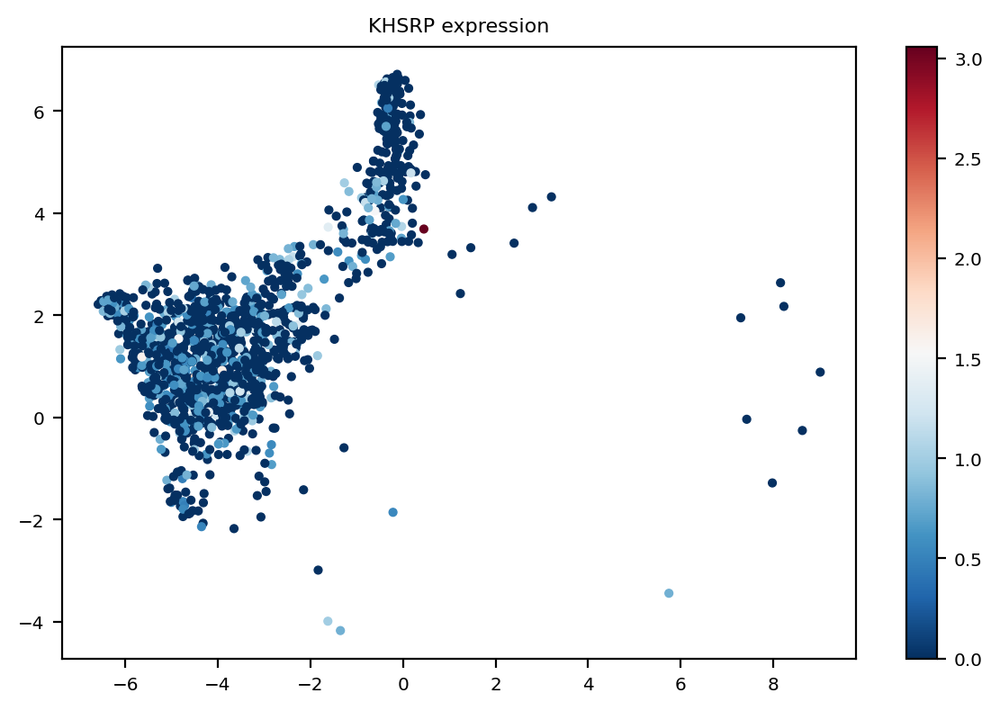

...

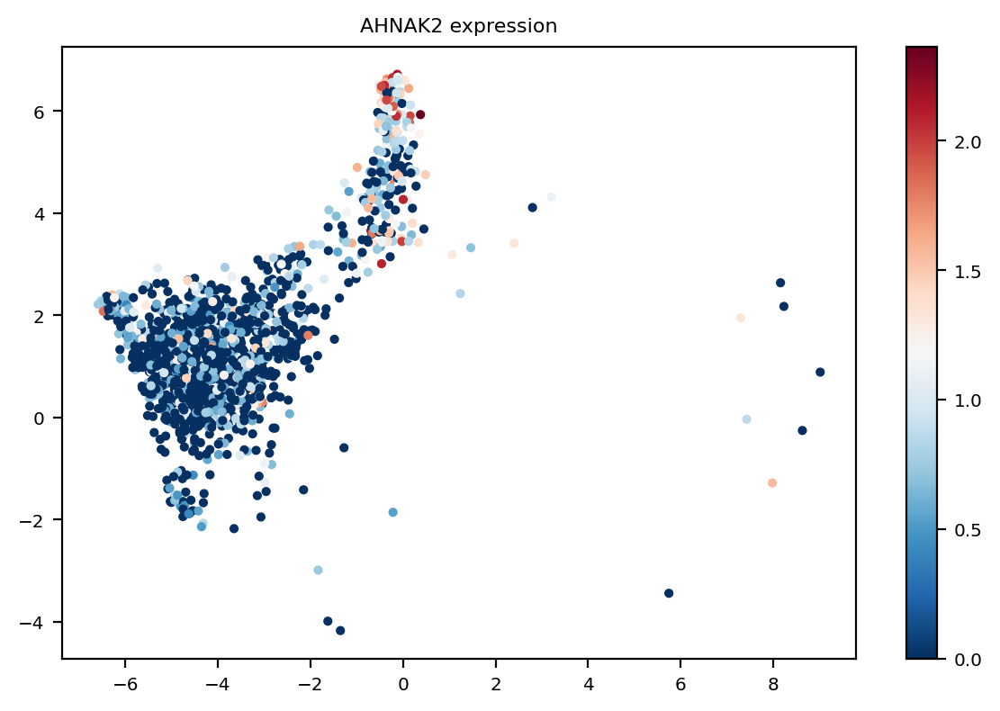

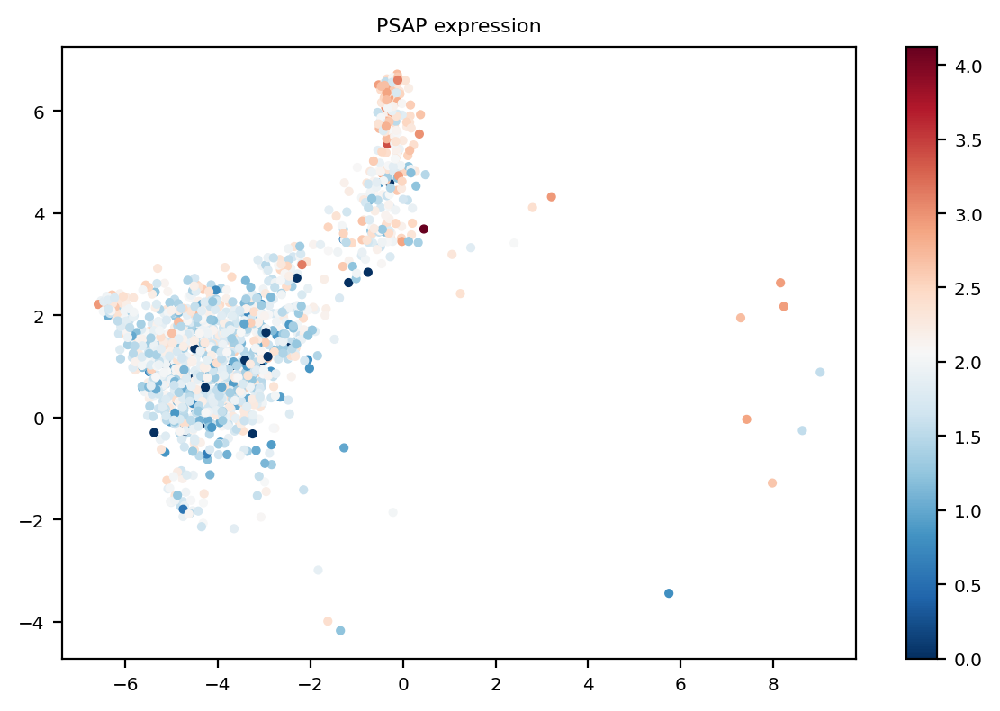

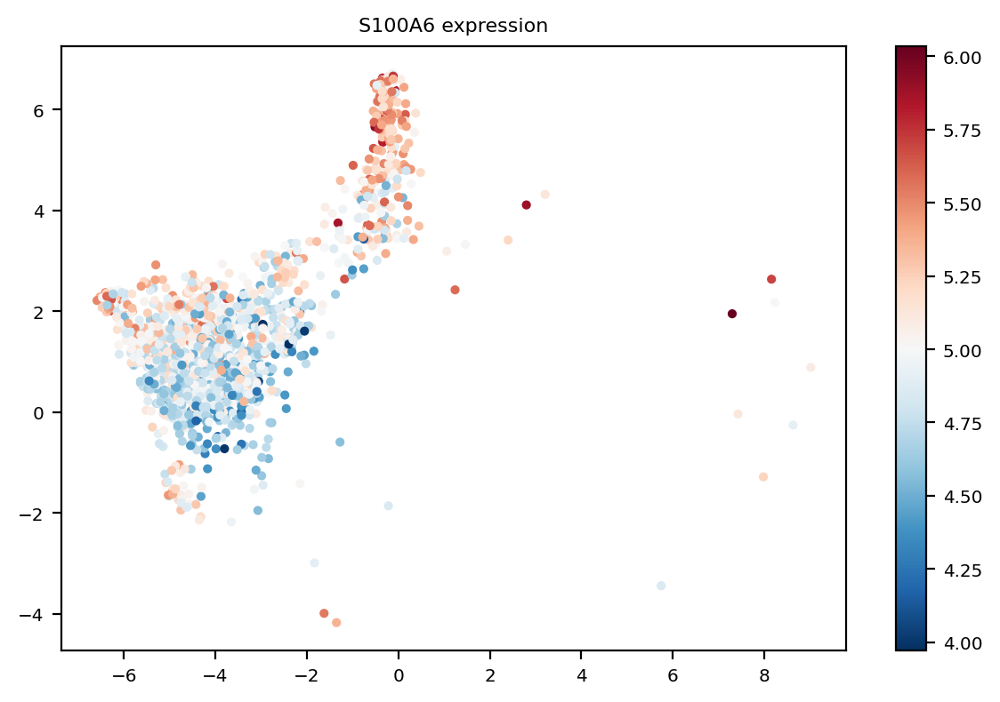

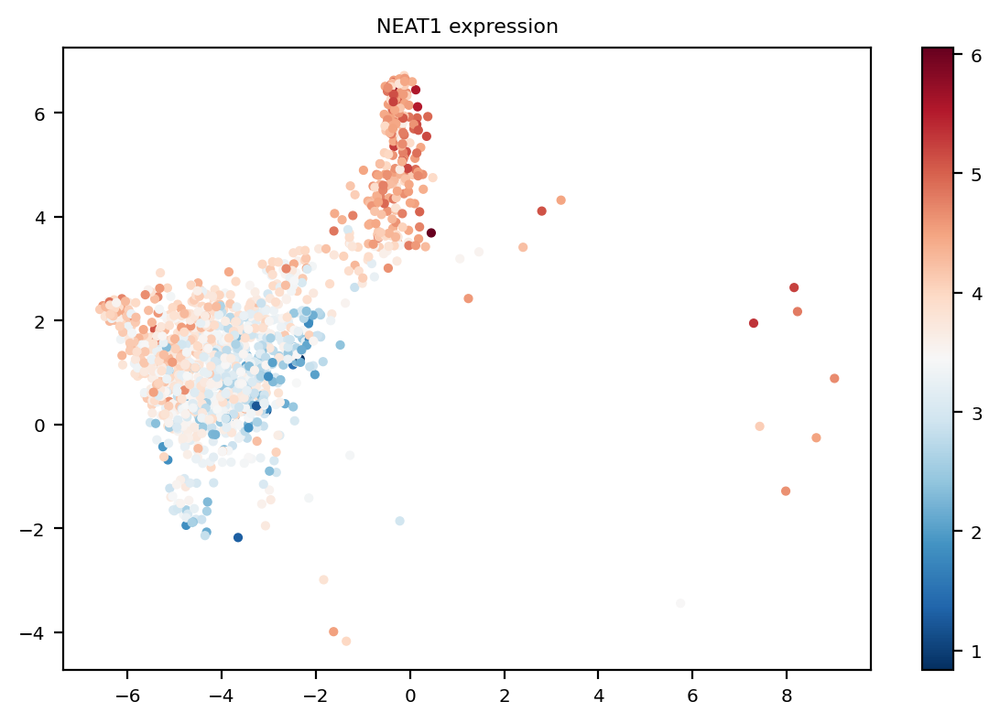

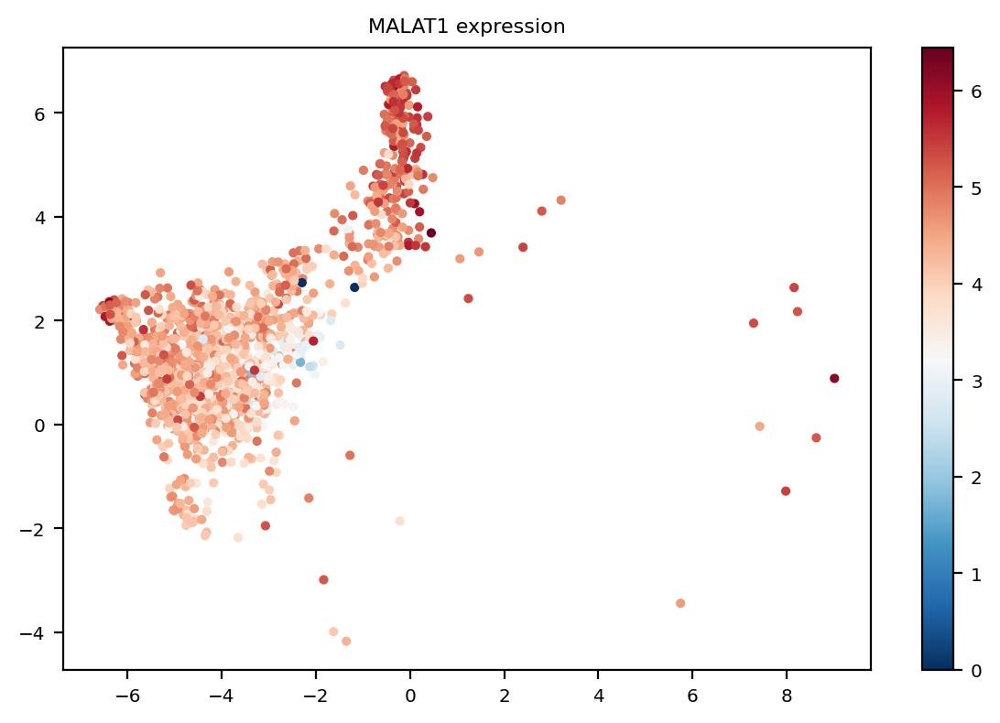

In [60]:
X_data = same_ref_with_density[0].X.toarray()
for gene in valid_down_reg:
    gene_index = same_ref_with_density[0].var.index.get_loc(gene)
    plt.scatter(same_ref_with_density[0].obsm['X_umap'][:,0],
                same_ref_with_density[0].obsm['X_umap'][:,1],
                c=X_data[:,gene_index],
                s=10,
                cmap='RdBu_r')
    plt.colorbar()
    plt.title(gene + " expression")
    plt.tight_layout()
    plt.savefig("../../plots/quiescence/down_reg/"+gene+"exp.png", dpi=300)
    plt.show()

# MCF10A vector fields

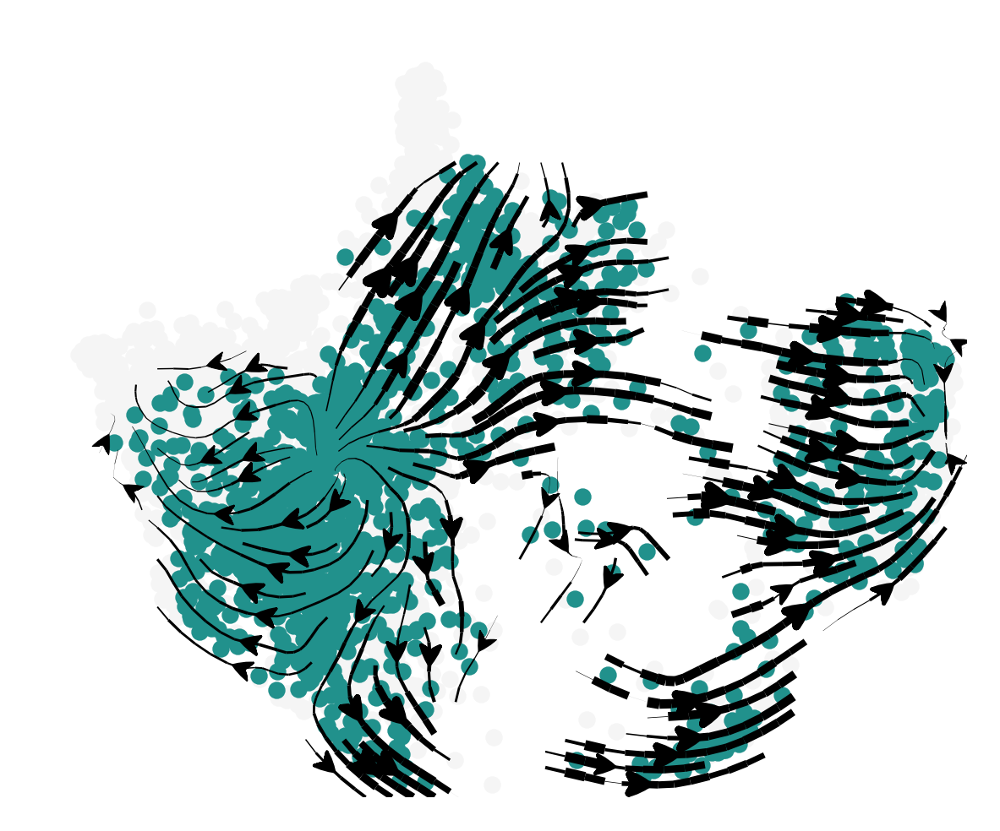

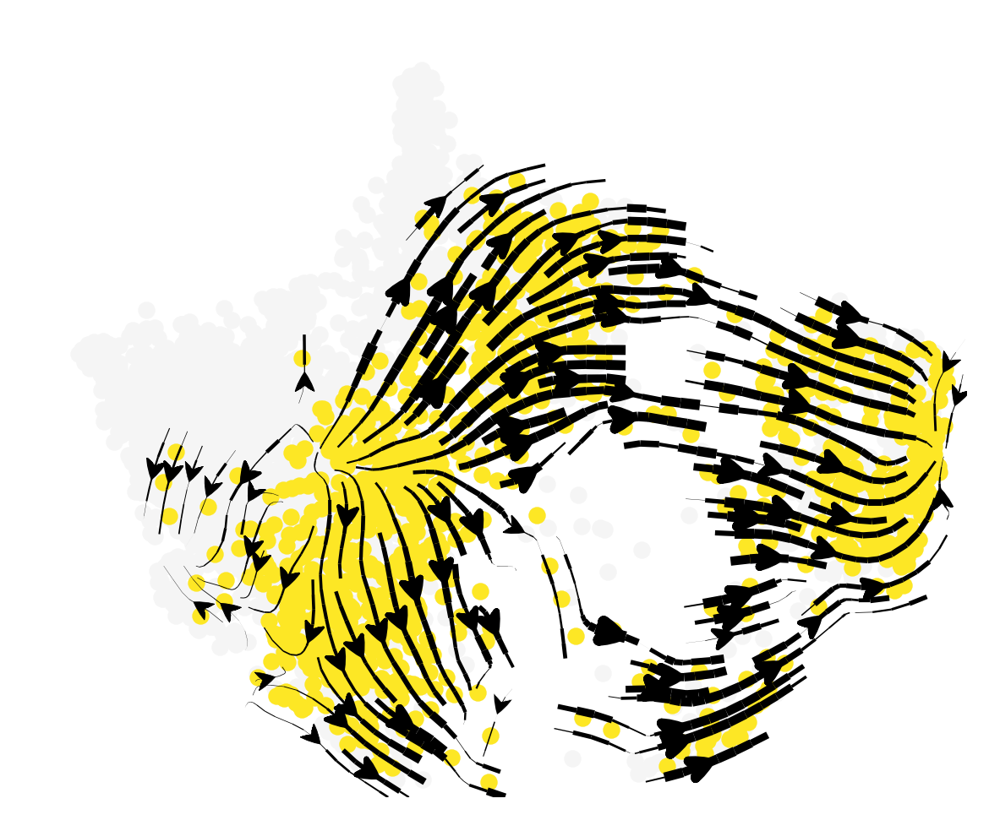

In [20]:
# EMT progression: MCF10A dataset
colormap = plt.cm.get_cmap("viridis")
for i in range(1,3):
    plt.figure(figsize=(3,2.5), dpi=200)
    plt.subplot(1,1,1,frame_on=False)
    for j in range(3):
        plt.scatter(same_ref_with_density[j].obsm['X_umap'][:,0],
                    same_ref_with_density[j].obsm['X_umap'][:,1],
                    color='whitesmoke',
                    s=10, 
                    zorder=1)
    plt.scatter(same_ref_with_density[i].obsm['X_umap'][:,0],
                same_ref_with_density[i].obsm['X_umap'][:,1],
                color=colormap(i/2),
                s=10,
                label=str(data_names[i]) + "pM", 
                zorder=2)
    dyn.pl.zstreamline(same_ref_with_density[i], basis='umap', 
                       density=0.7, 
                       linewidth=1.25, #arrowsize=0.5, 
                       zorder=3)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    #plt.savefig(fig_path + "panel_MCF10A_dose_vf_3_doses_"+str(data_names[i])+".png", dpi=300, transparent=True)

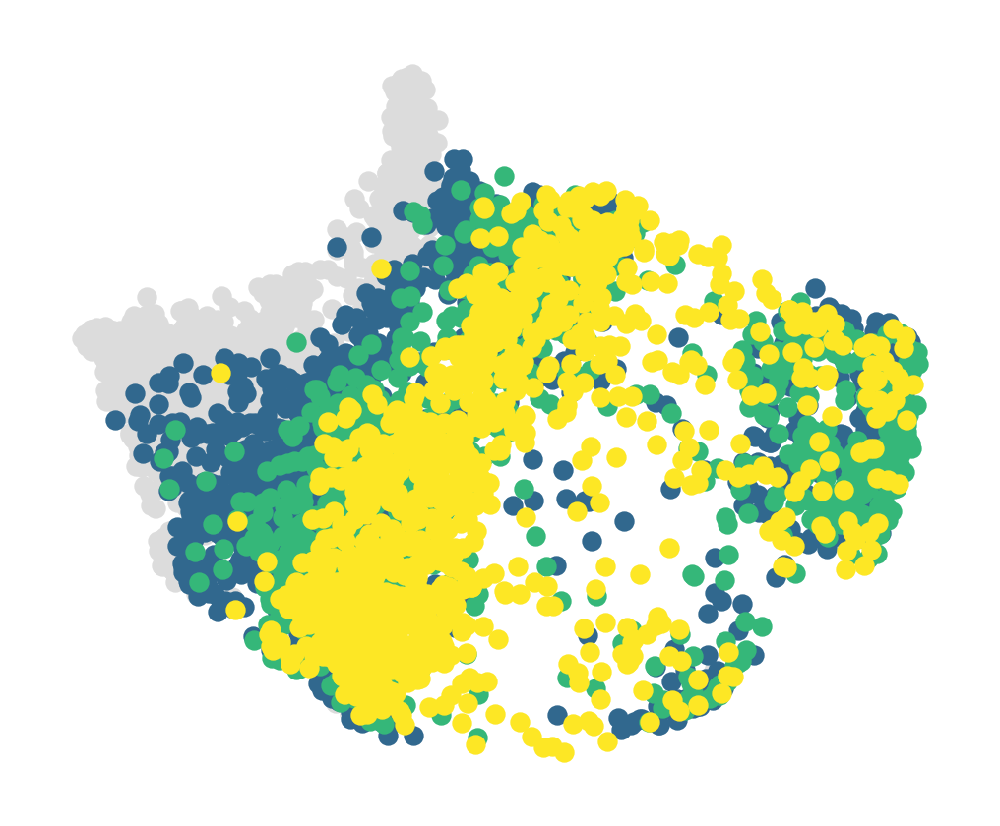

In [366]:
plt.figure(figsize=(3,2.5), dpi=200)
plt.subplot(1,1,1,frame_on=False)
plt.scatter(same_ref_with_density[0].obsm['X_umap'][:,0],
            same_ref_with_density[0].obsm['X_umap'][:,1],
            color='gainsboro',
            s=10)
for i in range(1,4):
    plt.scatter(same_ref_with_density[i].obsm['X_umap'][:,0],
                same_ref_with_density[i].obsm['X_umap'][:,1],
                color=colormap(i/3),
                s=10)
plt.xticks([])
plt.yticks([])
#plt.savefig(fig_path + "panelF_low_doses_UMAP.png", transparent=True, dpi=300)

In [37]:
_, stable, _, _ = getFixedPoints(same_ref_with_density[1], basis='umap')
stable[stable[:,3]>0.90]

array([[ 8.84585839,  1.50670024, -1.        ,  0.90405339],
       [-3.82157339, -0.63326615, -1.        ,  1.        ]])

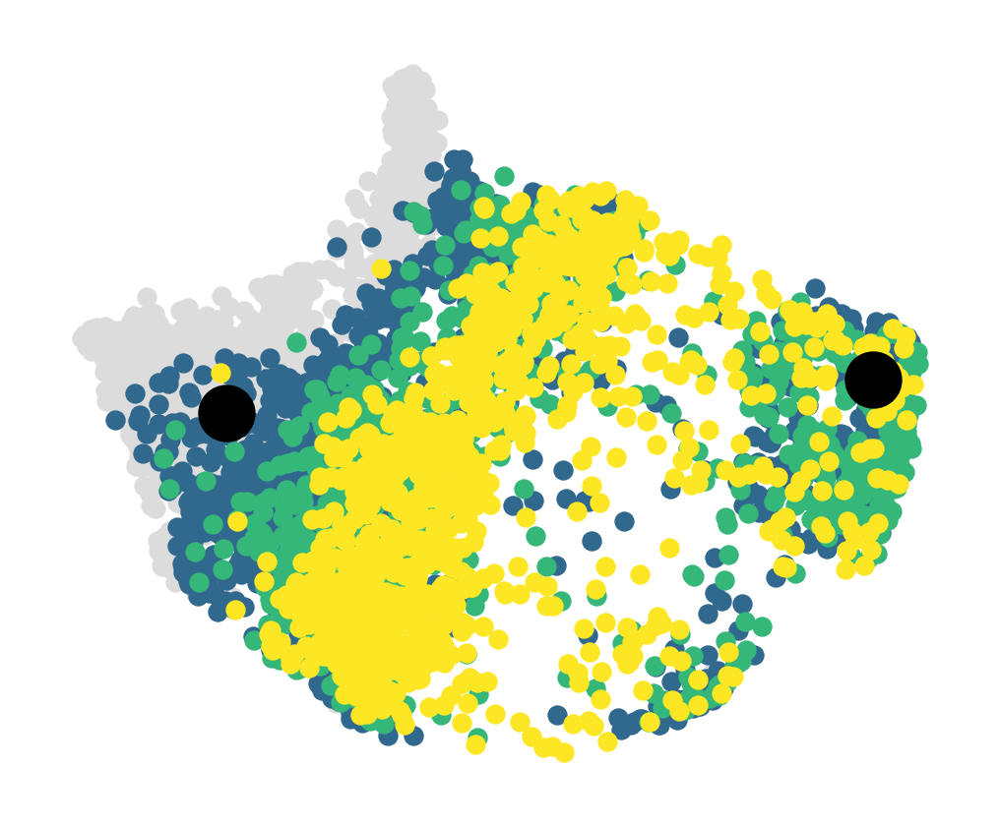

In [40]:
plt.figure(figsize=(3,2.5), dpi=200)
plt.subplot(1,1,1,frame_on=False)
colormap = plt.cm.get_cmap("viridis")
plt.scatter(same_ref_with_density[0].obsm['X_umap'][:,0],
            same_ref_with_density[0].obsm['X_umap'][:,1],
            color='gainsboro',
            s=10)
for i in range(1,4):
    plt.scatter(same_ref_with_density[i].obsm['X_umap'][:,0],
                same_ref_with_density[i].obsm['X_umap'][:,1],
                color=colormap(i/3),
                s=10)
plt.xticks([])
plt.yticks([])
plt.scatter(same_ref_without_density[0].obsm['X_umap'][index][0], 
            same_ref_without_density[0].obsm['X_umap'][index][1],
            s=100,
            color='black')
plt.scatter(8.84585839,  
            1.50670024,
            s=100,
            color='black')
#plt.savefig(fig_path + "panelH_cell_selection_EMT_progression.png", transparent=True, dpi=300)

# MCF10A EMT heatmaps

In [340]:
low_dose_UMAP = same_ref_with_density[1].concatenate(same_ref_with_density[2], same_ref_with_density[3])

In [341]:
dyn.tl.neighbors(low_dose_UMAP, basis='umap')

|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:umap
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> <insert> connectivities to obsp in AnnData Object.
|-----> <insert> distances to obsp in AnnData Object.
|-----> <insert> neighbors to uns in AnnData Object.
|-----> <insert> neighbors.indices to uns in AnnData Object.
|-----> <insert> neighbors.params to uns in AnnData Object.


AnnData object with n_obs × n_vars = 3468 × 1000
    obs: 'dosage', 'obs_names', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'ntr', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap', 'batch'
    var: 'pass_basic_filter', 'use_for_pca', 'beta', 'alpha_b', 'alpha_r2', 'gamma_b', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'Accession-0', 'Chromosome-0', 'End-0', 'Start-0', 'Strand-0', 'var_names-0', 'nCells-0', 'nCounts-0', 'log_m-0', 'log_cv-0', 'score-0', 'frac-0', 'ntr-0', 'gamma-0', 'half_life-0', 'gamma_r2-0', 'gamma_logLL-0', 'use_for_transition-0', 'Accession-1', 'Chromosome-1', 'End-1', 'Start-1', 'Strand-1', 'var_names-1', 'nCells-1', 'nCounts-1', 'log_m-1', 'log_cv-1', 'score-1', 'frac-1', 'ntr-1', 'gamma-

In [346]:
with plt.rc_context({"figure.figsize": (6, 4), "figure.dpi": (100)}):
    #low_dose_UMAP.var.index = low_dose_UMAP.var['var_names-1']
    sc.tl.louvain(low_dose_UMAP, resolution=0.04, key_added='louvain_r0.2', random_state=10)
    #same_ref_without_density[1].obs['louvain_r0.2'].value_counts()
    sc.pl.umap(low_dose_UMAP, color=['louvain_r0.2'], palette=sc.pl.palettes.vega_20)
    sc.tl.rank_genes_groups(low_dose_UMAP, groupby='louvain_r0.2', key_added='rank_genes_r0.2', groups=[0,1])
    sc.pl.rank_genes_groups(low_dose_UMAP, key='rank_genes_r0.2', groups=['0'], fontsize=12)
    sc.pl.rank_genes_groups(low_dose_UMAP, key='rank_genes_r0.2', groups=['1'], fontsize=12)

ContextualVersionConflict: (igraph 0.9.11 (/net/capricorn/home/xing/soh29/.conda/envs/dynamo/lib/python3.8/site-packages), Requirement.parse('igraph<0.11,>=0.10.0'), {'louvain'})

In [ ]:
# Plots genes by cells (from different attractors)
# Perform some hierarchical clustering to group similar gene expressions 
# Using dose 12.5 data - epithelial and mesenchymal states

adata = same_ref_with_density[1]
_, stable, unstable, saddle = getFixedPoints(adata, basis='umap')
epithelial_indices = getNNeighbors(stable[1,0:2], low_dose_UMAP.obsm['X_umap'], k=125).T[:,0]
mesenchymal_indices = getNNeighbors(stable[0,0:2], low_dose_UMAP.obsm['X_umap'], k=125).T[:,0]

num_genes = 15
cluster0_gene_list = [i[0] for i in low_dose_UMAP.uns['rank_genes_r0.2']['names']][0:num_genes]
cluster1_gene_list = [i[1] for i in low_dose_UMAP.uns['rank_genes_r0.2']['names']][0:num_genes]

gene_names = cluster0_gene_list + cluster1_gene_list

print(gene_names)
cell_indices = np.concatenate((epithelial_indices, mesenchymal_indices))

gene_exp_cluster0 = []
gene_exp_cluster1 = []
for i in range(len(gene_names)):
    gene_index = np.where(low_dose_UMAP.var['var_names'] == gene_names[i])[0][0]
    temp = low_dose_UMAP[epithelial_indices,gene_index]
    temp_gene_exp = temp.X.toarray()
    gene_exp_cluster0.append(temp_gene_exp[:,0])

    gene_index = np.where(low_dose_UMAP.var['var_names'] == gene_names[i])[0][0]
    temp = low_dose_UMAP[mesenchymal_indices,gene_index]
    temp_gene_exp = temp.X.toarray()
    gene_exp_cluster1.append(temp_gene_exp[:,0])
    
gene_exp_cluster0 = np.array(gene_exp_cluster0)
gene_exp_cluster1 = np.array(gene_exp_cluster1)

gene_exp_all = np.concatenate((gene_exp_cluster0, gene_exp_cluster1), 1)

cluster0_genes = np.repeat("Epithelial genes", num_genes)
cluster1_genes = np.repeat("Mesenchymal genes", num_genes)

gene_groups = np.concatenate((cluster0_genes, cluster1_genes),0)
gene_groups = pd.Series(gene_groups, dtype=object)

lut = dict(zip(gene_groups.unique(), sns.color_palette("Paired",2)))
row_colors = gene_groups.map(lut)

g = sns.clustermap(gene_exp_all.T, col_colors=row_colors.to_numpy(), figsize=(6,4))
g.ax_row_dendrogram.set_visible(False)

from matplotlib.patches import Patch
handles = [Patch(facecolor=lut[name]) for name in lut]
plt.legend(handles, lut, 
           #title='Gene groups', fontsize = 16,
           bbox_to_anchor=(1.25, 1), bbox_transform=plt.gcf().transFigure, loc='upper right', prop={'size': 10})

previous_xlabels = g.ax_heatmap.get_xticklabels()
new_xlabels = []
for i, xtickdata in enumerate(previous_xlabels):
    gene_num = int(xtickdata._text)
    new_xlabels.append(gene_names[gene_num])
    
g.ax_heatmap.set_xticklabels(new_xlabels, rotation=90)
g.ax_heatmap.set_yticks([])
#g.savefig("Plots/Characterize_attractors/low_doses_heatmap_20_genes.png", dpi=300)